In [ ]:
pip install transformers

In [10]:
from transformers import ViTForImageClassification, ViTImageProcessor
import torch

In [11]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')


In [12]:
model_name = 'google/vit-base-patch16-224'
model = ViTForImageClassification.from_pretrained(model_name)
model.to(device)

ViTForImageClassification(
  (vit): ViTModel(
    (embeddings): ViTEmbeddings(
      (patch_embeddings): ViTPatchEmbeddings(
        (projection): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
      )
      (dropout): Dropout(p=0.0, inplace=False)
    )
    (encoder): ViTEncoder(
      (layer): ModuleList(
        (0-11): 12 x ViTLayer(
          (attention): ViTAttention(
            (attention): ViTSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
            )
            (output): ViTSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.0, inplace=False)
            )
          )
          (intermediate): ViTIntermediate(
            (dense): Linear(in_features=768, out_features=3072, bias=True)
            (intermed

In [13]:
processor = ViTImageProcessor.from_pretrained(model_name)

In [14]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


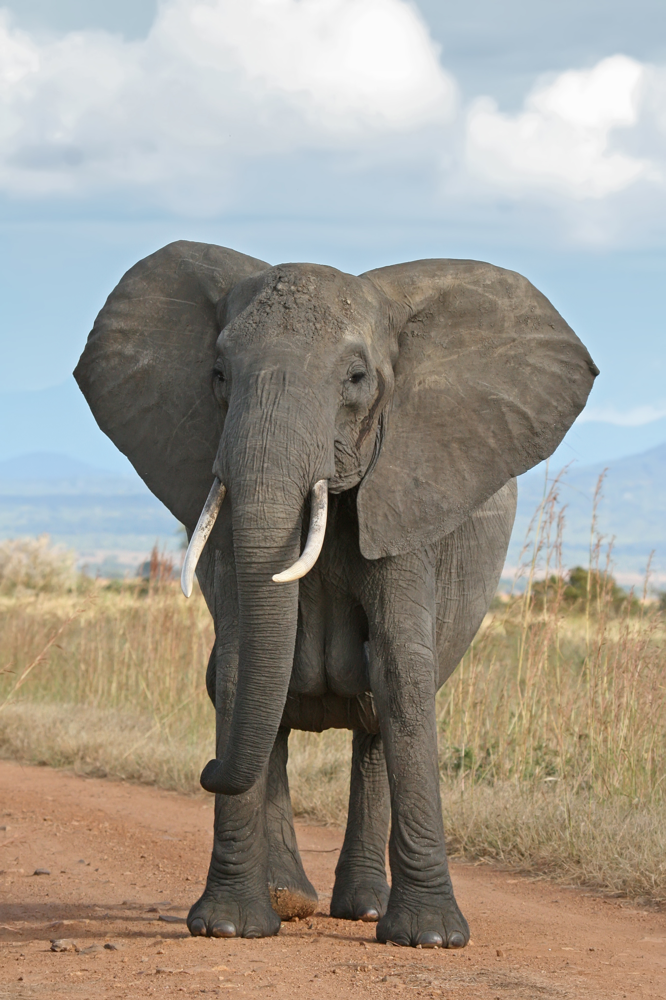

In [26]:
from PIL import Image

imag_path = '/content/drive/MyDrive/Large vision/CLIP_MODEL_ImageSearch/images/elephant1.jpg'
image = Image.open(imag_path)
image

In [27]:
inputs = processor(images = image, return_tensors = 'pt' ).to(device) # pt ==> pytorch array

pixel_values = inputs.pixel_values
pixel_values


tensor([[[[ 0.4588,  0.4667,  0.4667,  ...,  0.4039,  0.4039,  0.3961],
          [ 0.5137,  0.5294,  0.5137,  ...,  0.3961,  0.3961,  0.3961],
          [ 0.6392,  0.6392,  0.6000,  ...,  0.3882,  0.3882,  0.3882],
          ...,
          [ 0.3882,  0.4039,  0.4118,  ...,  0.4980,  0.4902,  0.4745],
          [ 0.4510,  0.4431,  0.4353,  ...,  0.4824,  0.4980,  0.5216],
          [ 0.3412,  0.3725,  0.4039,  ...,  0.4275,  0.4431,  0.5059]],

         [[ 0.6000,  0.6000,  0.6000,  ...,  0.5529,  0.5529,  0.5529],
          [ 0.6392,  0.6471,  0.6314,  ...,  0.5451,  0.5451,  0.5451],
          [ 0.7176,  0.7176,  0.6863,  ...,  0.5373,  0.5373,  0.5373],
          ...,
          [ 0.1059,  0.1216,  0.1294,  ...,  0.1686,  0.1608,  0.1529],
          [ 0.2000,  0.1843,  0.1765,  ...,  0.1529,  0.1686,  0.1922],
          [ 0.0980,  0.1294,  0.1451,  ...,  0.0902,  0.1059,  0.1686]],

         [[ 0.6784,  0.6784,  0.6784,  ...,  0.6471,  0.6392,  0.6392],
          [ 0.7020,  0.7098,  

In [28]:
with torch.no_grad(): # make process faster because it will not process gradients
  outputs = model(pixel_values)
  logits = outputs.logits

prediction = logits.argmax(-1)  # to return max value from array
print(f'predicted class: {model.config.id2label[prediction.item()]}')

predicted class: African elephant, Loxodonta africana
